<a href="https://colab.research.google.com/github/mattshu0410/Peripheral-Blood-Deep-Learning/blob/main/SAHI_%26_YOLOv5s.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SAHI & YOLOv5s on Blood Film

Previously I trained a YOLOv5s model on BCCD dataset for object detection. It was able to recognise WBC, RBC and platelets. However, these images are 416px by 416px and are at about 100x magnification. If we attempt to use the same model to inference on traditional large blood film images e.g. at 20x or 40x, small RBC are not detected at all.

Hence, we implement Slicing Aided Hyperinference (SAHI) which traverses over the image in slices and applies the YOLOV5s model successively on each slice.

https://www.nature.com/articles/s41598-021-98599-0


In [ ]:
!pip install -U torch sahi yolov5

In [1]:
#Importing required functions and classes
from sahi.utils.yolov5 import ( download_yolov5s6_model )
from sahi.model import Yolov5DetectionModel
from sahi.utils.cv import read_image
from sahi.predict import get_prediction, get_sliced_prediction, predict
from IPython.display import Image

Here we load a pre-trained YOLOv5s model and a peripheral blood film image at 40x magnification.

In [2]:
#Loading trained model
model_path = '/content/4-01-2022-artemis.pt'
download_yolov5s6_model(destination_path=model_path)

## Inference w/o SAHI

As you can see, the model is not very effective at detecting RBC or WBC.

In [ ]:
#instantiating a new YOLOv5 detection model object
model = Yolov5DetectionModel(
    model_path=model_path,
    confidence_threshold=0.3,
    device="cpu"
)

In [ ]:
result = get_prediction("/content/40x.jpeg", model)

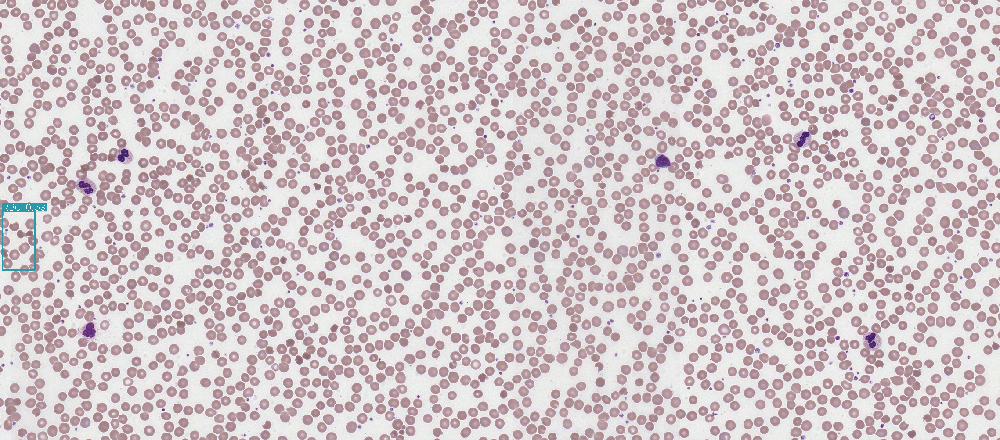

In [7]:
result.export_visuals(export_dir="/content/")
Image("/content/prediction_visual.png")

## Inference w/ SAHI

The test image being used here is 2277 by 1033 at 40x magnification. The model was trained on 416 by 416 at 100 magnification. Therefore the required size of the slice should be of dimensions $416 * 0.4 = 166.4 $

Here you can see the performance is much improved.

In [8]:
import warnings
warnings.filterwarnings('ignore')

#Setting the slice parameters
result = get_sliced_prediction(
    image = "/content/40x.jpeg",
    detection_model = model,
    slice_height = 166,
    slice_width = 166,
    overlap_width_ratio = 0.2,
    overlap_height_ratio = 0.2
)

Performing prediction on 136 number of slices.


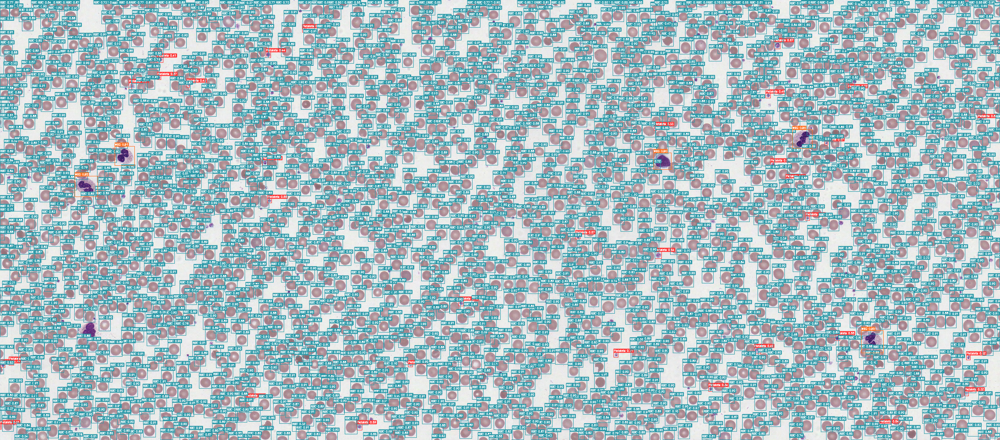

In [9]:
#Exporting visuals for viewing
result.export_visuals(
    export_dir = '/content/prediction_with_sahi',
    text_size = 0.2,
    rect_th = 1
    )
Image("/content/prediction_with_sahi/prediction_visual.png")

## Cropping out White Cells

The next stage involves cropping out these white blood cells for further classification. Whilst we use the bounding box annotated by the YOLOv5s model, we use the $max(width, height)$. This ensures a square image that can be fed into a white blood cell classifier that has been trained on square images.

In [71]:
#Exporting annotations in COCO format i.e. minx, miny, width, height for 
annotations = result.to_coco_annotations() 
wbc_annot = []
for item in annotations:
  if (item['category_name'] == 'WBC'):
    wbc_annot.append(item)

print(wbc_annot)

[{'image_id': None, 'bbox': [170, 401, 52, 47], 'score': 0.9247288107872009, 'category_id': 2, 'category_name': 'WBC', 'segmentation': [], 'iscrowd': 0, 'area': 2444}, {'image_id': None, 'bbox': [1961, 753, 50, 51], 'score': 0.9217663407325745, 'category_id': 2, 'category_name': 'WBC', 'segmentation': [], 'iscrowd': 0, 'area': 2550}, {'image_id': None, 'bbox': [261, 333, 45, 44], 'score': 0.9054731726646423, 'category_id': 2, 'category_name': 'WBC', 'segmentation': [], 'iscrowd': 0, 'area': 1980}, {'image_id': None, 'bbox': [1488, 348, 40, 38], 'score': 0.9044601917266846, 'category_id': 2, 'category_name': 'WBC', 'segmentation': [], 'iscrowd': 0, 'area': 1520}, {'image_id': None, 'bbox': [1804, 295, 45, 43], 'score': 0.8986550569534302, 'category_id': 2, 'category_name': 'WBC', 'segmentation': [], 'iscrowd': 0, 'area': 1935}]


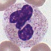

In [73]:
import PIL
import numpy as np

#Cropping out the white blood cells
image = PIL.Image.open('/content/40x.jpeg')
image_array = np.array(image)
for i, annot in enumerate(wbc_annot):
  bbox = annot['bbox']
  x,y,w,h = int(bbox[0]), int(bbox[1]), int(bbox[2]), int(bbox[3])
  w=h=max(w,h)
  crop_img=image_array[y:y+ h, x:x + w]
  im = PIL.Image.fromarray(crop_img)
  im.save(f'wbc{i}.png')
Image('/content/wbc1.png')

## Classifying the White Cells

